In [229]:
import math
import numpy as np
import pandas as pd
import scipy.stats as stats
import matplotlib.pyplot as plt
from collections import defaultdict
from scipy.stats.stats import pearsonr
from sklearn.preprocessing import StandardScaler, MinMaxScaler
from scipy.cluster.hierarchy import linkage, dendrogram
import seaborn as sns

C:\Users\minhd\AppData\Local\Temp\ipykernel_14700\673120910.py:7: DeprecationWarning: Please use `pearsonr` from the `scipy.stats` namespace, the `scipy.stats.stats` namespace is deprecated.
  from scipy.stats.stats import pearsonr


In [230]:
df = pd.read_csv('df_final1.csv')
df = df.rename(columns={'Unnamed: 0': 'index'})
df['index'] = df['index'].astype(str)
df

,index,name,duration_ms,explicit,popularity,artists,album_name,danceability,energy,key,...,acousticness,instrumentalness,liveness,valence,tempo,time_signature,n_beats,n_bars,processing,genre
0,0,Long Road,241760,False,46,Funki Porcini,Hed Phone Sex,0.690,0.513,5,...,0.302000,0.536000,0.2810,0.6350,142.221,4.0,567.0,141.0,1.279305,j-dance
1,1,"Daniâl My Son, Where Did You Vanish?",444000,False,0,Siavash Amini,A Trail of Laughters,0.069,0.196,1,...,0.283000,0.934000,0.3600,0.0336,75.596,4.0,617.0,155.0,2.367412,iranian
2,2,Ondskapens Galakse,333506,False,3,Kvelertak,Nattesferd,0.363,0.854,2,...,0.000089,0.800000,0.2620,0.4890,116.628,4.0,652.0,162.0,3.700483,black-metal
3,3,Can't Look Away,269800,False,23,The Wood Brothers,One Drop of Truth,0.523,0.585,5,...,0.066400,0.001270,0.1170,0.3850,140.880,4.0,619.0,155.0,1.279305,bluegrass
4,4,Thunderground,307651,False,25,The Darkraver;DJ Vince,Happy Hardcore Top 100,0.643,0.687,7,...,0.000576,0.096900,0.2990,0.6370,143.956,4.0,733.0,183.0,4.067086,happy
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
13242,14995,Outpt,432026,False,0,Autechre,EP7,0.554,0.657,1,...,0.016000,0.615000,0.1320,0.0335,117.319,4.0,837.0,212.0,2.367412,idm
13243,14996,Natural Environment Sounds: To Improve Sleep a...,182746,False,44,Natural White Noise Relaxation,Baby Sleep White Noise: Ultimate Album to Help...,0.103,0.860,1,...,0.548000,0.940000,0.1230,0.0016,92.323,3.0,277.0,92.0,2.367412,sleep
13244,14997,Psychological Attack,400091,False,43,Droplex,Psychological Attack,0.799,0.535,1,...,0.001830,0.857000,0.0713,0.0708,126.000,4.0,837.0,209.0,2.367412,techno
13245,14998,Don't Hate The 808 (feat. Lafa Taylor),197250,False,37,Bassnectar;Lafa Taylor,Noise vs Beauty,0.511,0.970,5,...,0.000337,0.000014,0.4020,0.2700,160.044,4.0,513.0,130.0,1.279305,breakbeat


In [231]:
df.dtypes

index                object
name                 object
duration_ms           int64
explicit               bool
popularity            int64
artists              object
album_name           object
danceability        float64
energy              float64
key                   int64
loudness            float64
mode                float64
speechiness         float64
acousticness        float64
instrumentalness    float64
liveness            float64
valence             float64
tempo               float64
time_signature      float64
n_beats             float64
n_bars              float64
processing          float64
genre                object
dtype: object

In [232]:
selected_attributes = ['duration_ms','popularity',
    'danceability',
    'energy',
    'loudness',
    'speechiness',
    'acousticness',
    'instrumentalness',
    'liveness',
    'valence',
    'tempo','n_beats','n_bars'
]

### Preprocessing

#### Check categorical variables

In [233]:
df_train = df.drop(['index','name', 'artists', 'album_name', 'genre','explicit','key','mode','time_signature','processing'], axis=1)
df_train.dtypes

duration_ms           int64
popularity            int64
danceability        float64
energy              float64
loudness            float64
speechiness         float64
acousticness        float64
instrumentalness    float64
liveness            float64
valence             float64
tempo               float64
n_beats             float64
n_bars              float64
dtype: object

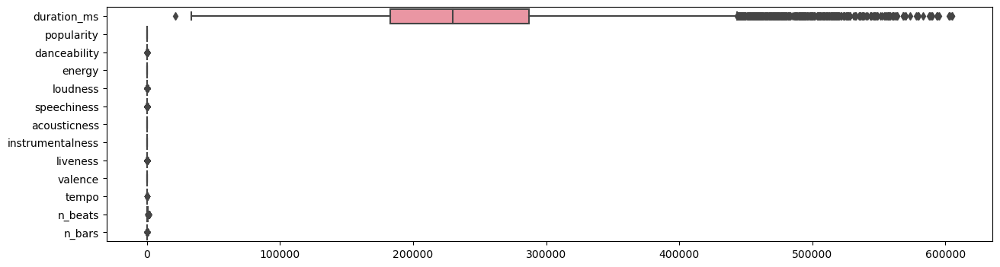

In [234]:
plt.figure(figsize = (15,4))
sns.boxplot(data = df_train, orient = "h")
plt.show()

## Standardize value 

In [235]:
scaler = StandardScaler()
scaled_array = scaler.fit_transform(df_train)

In [236]:
scaled_df = pd.DataFrame( scaled_array, columns = df_train.columns )

In [237]:
scaled_df.to_csv('E:\Data Science and Business Informatics\Data Mining\Data Mining 1\Project\scaled1.csv')

In [238]:
scaled_df.head()

,duration_ms,popularity,danceability,energy,loudness,speechiness,acousticness,instrumentalness,liveness,valence,tempo,n_beats,n_bars
0,0.003962,0.998858,0.669530,-0.636873,-0.987134,0.371832,0.049098,0.710297,0.601947,0.663681,0.599790,0.340657,0.279785
1,2.284760,-1.479827,-2.817840,-1.920738,-3.726561,0.096930,-0.010552,1.773741,1.138383,-1.557306,-1.644221,0.574288,0.534554
2,1.038644,-1.318174,-1.166815,0.744194,0.147746,-0.562834,-0.898752,1.415697,0.472930,0.124499,-0.262214,0.737830,0.661938
3,0.320188,-0.240485,-0.268298,-0.345269,0.558035,0.032248,-0.690569,-0.718486,-0.511669,-0.259576,0.554623,0.583633,0.534554
4,0.747060,-0.132716,0.405590,0.067836,-0.721718,-0.333210,-0.897224,-0.462966,0.724173,0.671067,0.658227,1.116312,1.044090


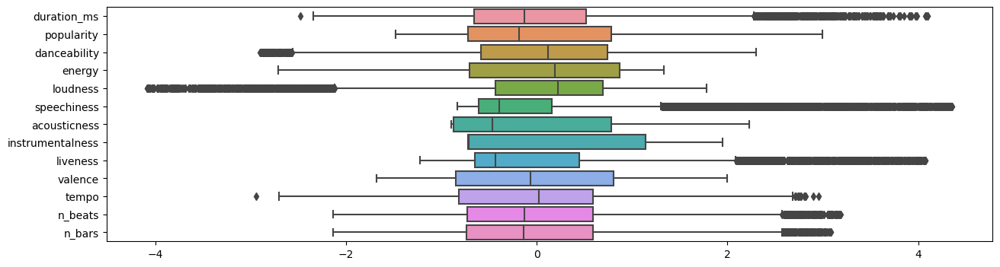

In [239]:
plt.figure(figsize = (15,4))
sns.boxplot(data = scaled_df, orient = "h")
plt.show()

In [240]:
scaled_df.describe()

,duration_ms,popularity,danceability,energy,loudness,speechiness,acousticness,instrumentalness,liveness,valence,tempo,n_beats,n_bars
count,1.324700e+04,1.324700e+04,1.324700e+04,1.324700e+04,1.324700e+04,1.324700e+04,1.324700e+04,1.324700e+04,1.324700e+04,1.324700e+04,1.324700e+04,1.324700e+04,1.324700e+04
mean,2.333253e-17,7.402046e-17,1.866603e-16,-5.342346e-16,-2.134793e-16,-1.877330e-16,7.455684e-17,-9.118462e-18,3.754661e-17,1.770054e-17,-6.227373e-16,1.340950e-18,1.249766e-16
std,1.000038e+00,1.000038e+00,1.000038e+00,1.000038e+00,1.000038e+00,1.000038e+00,1.000038e+00,1.000038e+00,1.000038e+00,1.000038e+00,1.000038e+00,1.000038e+00,1.000038e+00
min,-2.482990e+00,-1.479827e+00,-2.906569e+00,-2.714466e+00,-4.092428e+00,-8.361190e-01,-8.990326e-01,-7.218798e-01,-1.226012e+00,-1.681392e+00,-2.945865e+00,-2.135830e+00,-2.140514e+00
25%,-6.611948e-01,-7.254450e-01,-5.827786e-01,-7.057234e-01,-4.335338e-01,-6.097292e-01,-8.742462e-01,-7.218798e-01,-6.515498e-01,-8.541537e-01,-8.196712e-01,-7.340451e-01,-7.392882e-01
50%,-1.330049e-01,-1.866004e-01,1.191880e-01,1.893373e-01,2.247591e-01,-3.946589e-01,-4.689203e-01,-7.164023e-01,-4.369751e-01,-6.753847e-02,1.848565e-02,-1.312774e-01,-1.387627e-01
75%,5.137867e-01,7.833199e-01,7.425343e-01,8.656955e-01,6.921940e-01,1.583790e-01,7.837425e-01,1.137812e+00,4.457688e-01,8.077094e-01,5.916725e-01,5.883058e-01,5.891468e-01
max,4.101593e+00,2.992583e+00,2.298092e+00,1.335501e+00,1.776179e+00,4.357910e+00,2.227915e+00,1.950091e+00,4.071809e+00,1.993172e+00,2.959327e+00,3.190954e+00,3.082237e+00


## K-means 

In [241]:
from sklearn.metrics import *
from sklearn.cluster import KMeans
from sklearn.cluster import DBSCAN
from sklearn.cluster import AgglomerativeClustering
from sklearn.neighbors import kneighbors_graph

In [242]:
sse = [] 
# Fit the KMeans model to the data with a range of different numbers of clusters
for k in range(2, 30):
    kmeans = KMeans(init='k-means++',n_clusters=k, n_init=10, max_iter=200)
    kmeans.fit(scaled_df)
    sse.append(kmeans.inertia_)  # Add the sum of squared distances for the current number of clusters to the list

In [243]:
sse

[142519.08065839764,
 122025.81282247834,
 114269.30166004215,
 107444.02604079367,
 101276.75194385732,
 96729.73352659344,
 92551.89692488028,
 88772.83450060201,
 86060.27065716498,
 83453.73262852733,
 81062.58135661556,
 78879.6126986217,
 77019.48437263782,
 75506.17710859282,
 74053.88169279335,
 73002.3679710069,
 71935.75714460807,
 70686.34794925035,
 69611.93882057046,
 68635.9034014197,
 67663.48008978594,
 66919.46734644329,
 66042.69518143439,
 65419.75404929917,
 64634.40911112462,
 63944.962972067064,
 63269.360099435144,
 62749.56075736083]

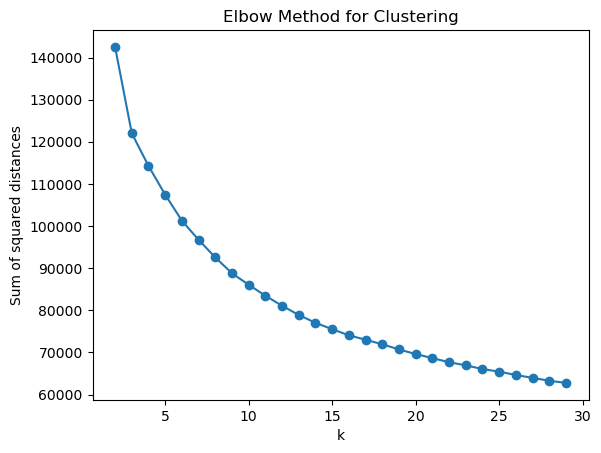

In [247]:
plt.plot(range(2, 30), sse, marker='o')
plt.title('Elbow Method for Clustering')
plt.xlabel('k')
plt.ylabel('Sum of squared distances')
plt.show()

In [248]:
elbow = dict()
silhouette = dict()
for i in range(2, 25):
    kmeans = KMeans(init='k-means++', n_clusters=i)
    clusters = kmeans.fit_predict(scaled_df)
    elbow[i] = kmeans.inertia_
    silhouette[i] = silhouette_score(scaled_df, clusters)

E:\Anaconda3\Lib\site-packages\sklearn\cluster\_kmeans.py:1412: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  super()._check_params_vs_input(X, default_n_init=10)
E:\Anaconda3\Lib\site-packages\sklearn\cluster\_kmeans.py:1412: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  super()._check_params_vs_input(X, default_n_init=10)
E:\Anaconda3\Lib\site-packages\sklearn\cluster\_kmeans.py:1412: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  super()._check_params_vs_input(X, default_n_init=10)
E:\Anaconda3\Lib\site-packages\sklearn\cluster\_kmeans.py:1412: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  s

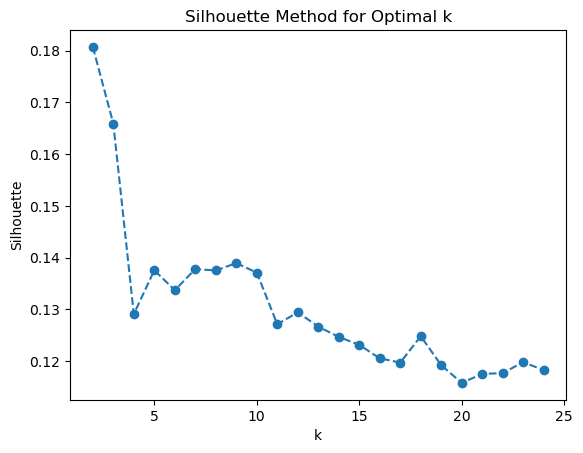

In [249]:
plt.plot(*zip(*silhouette.items()), marker='o', linestyle='--')
plt.title('Silhouette Method for Optimal k')
plt.ylabel('Silhouette')
plt.xlabel('k');


In [322]:
# initialize the KMeans model with 5 clusters
kmeans = KMeans(n_clusters=8, random_state=1)
kmeans.fit(scaled_df)

E:\Anaconda3\Lib\site-packages\sklearn\cluster\_kmeans.py:1412: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  super()._check_params_vs_input(X, default_n_init=10)


KMeans(random_state=1)

In [323]:
# generate cluster 
clusters = kmeans.predict(scaled_df)
print(clusters)

[7 1 5 ... 5 6 4]


In [324]:
# calculate the silhouette score for the generated clusters
silhouette_score(scaled_df, clusters)

0.1376671917269492

In [325]:
from sklearn.metrics import calinski_harabasz_score
from sklearn.metrics import davies_bouldin_score

In [326]:
davies_bouldin_score(scaled_df,clusters)

1.808410586146588

In [327]:
calinski_harabasz_score(scaled_df,clusters)

1629.4788015142137

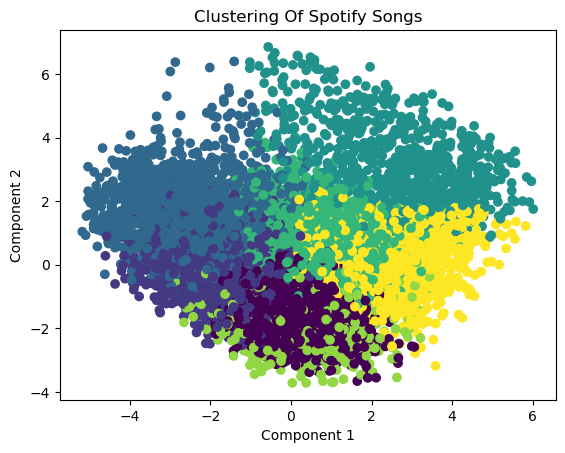

In [321]:
import matplotlib.pyplot as plt
from sklearn.decomposition import PCA
import numpy as np

# To visualize the generated clusters, we will first need to reduce the data to two dimensions, so that we can plot it on a scatter plot

pca = PCA(n_components=2)  # initialize a PCA model with 2 components
df_2d = pca.fit_transform(scaled_df)  # reduce the data to two dimensions using the PCA model

# plot the data points on a scatter plot
plt.scatter(df_2d[:, 0], df_2d[:, 1], c=clusters)
plt.title('Clustering Of Spotify Songs')
plt.xlabel('Component 1')
plt.ylabel('Component 2')
plt.show()

In [136]:
def plot_basic_statistics(df, labels, columns):
    df = pd.DataFrame(df, columns=columns)
    df['cluster'] = labels
    columns = df.columns[0:-1]     
    means = []
    std = []
    for i in np.unique(df['cluster'].array):
        clust = df.loc[df['cluster'] == i, columns]
        means.append(clust.describe().loc['mean'].values)
        std.append(clust.describe().loc['std'].values)  
    legend = []
    for i in np.unique(df['cluster'].array):
        plt.plot(range(0, columns.shape[0]), means[i], marker='o')
        legend.append('Cluster %d' %i)
    plt.legend(legend)
    plt.xticks(range(0, columns.shape[0]), columns)

Text(0.5, 1.0, 'Centroids analysis')

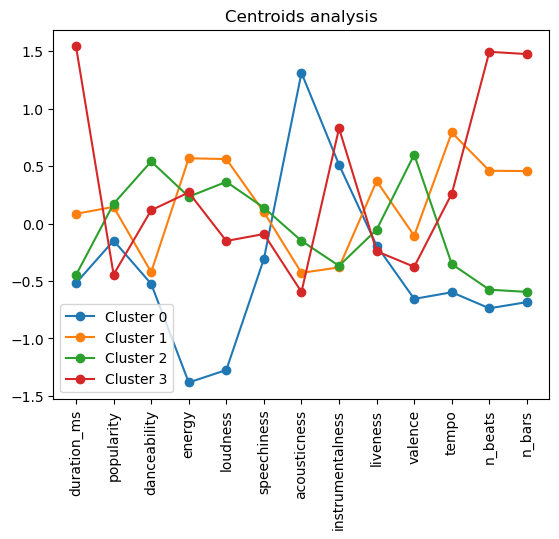

In [227]:
plot_basic_statistics(scaled_df, clusters, scaled_df.columns)
plt.xticks(rotation=90)
plt.title('Centroids analysis')

In [150]:
scaled_df

,danceability,energy,loudness,speechiness,acousticness,instrumentalness,liveness,valence,tempo,cluster
0,0.669530,-0.636873,-0.987134,0.371832,0.049098,0.710297,0.601947,0.663681,0.599790,0
1,-2.817840,-1.920738,-3.726561,0.096930,-0.010552,1.773741,1.138383,-1.557306,-1.644221,1
2,-1.166815,0.744194,0.147746,-0.562834,-0.898752,1.415697,0.472930,0.124499,-0.262214,0
3,-0.268298,-0.345269,0.558035,0.032248,-0.690569,-0.718486,-0.511669,-0.259576,0.554623,0
4,0.405590,0.067836,-0.721718,-0.333210,-0.897224,-0.462966,0.724173,0.671067,0.658227,0
...,...,...,...,...,...,...,...,...,...,...
13242,-0.094210,-0.053666,-1.367287,-0.302486,-0.848800,0.921382,-0.409814,-1.557676,-0.238940,1
13243,-2.626905,0.768494,-2.571591,-0.242654,0.821417,1.789773,-0.470927,-1.675483,-1.080835,1
13244,1.281645,-0.547772,-0.222362,-0.244271,-0.893287,1.567999,-0.821987,-1.419926,0.053447,0
13245,-0.335686,1.214000,1.296466,-0.346147,-0.897975,-0.721843,1.423577,-0.684274,1.200090,0


In [151]:
labels, counts = np.unique(clusters, return_counts=True)
print(labels, counts)

[0 1] [9624 3623]


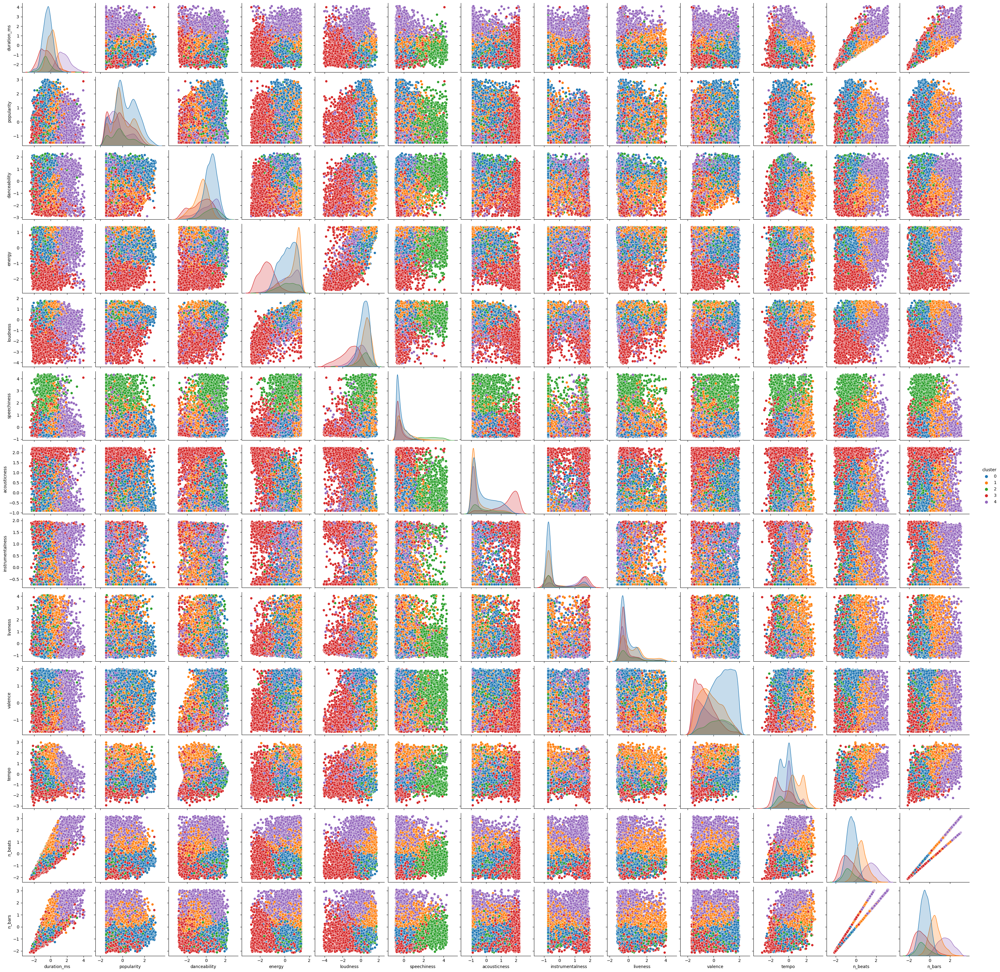

In [74]:
sns.pairplot(scaled_df, hue='cluster', palette='tab10')
plt.show()

## DBSCAN

In [29]:
df_db= pd.read_csv('df_final1.csv')
a = df_db[selected_attributes]
a.head()

,duration_ms,popularity,danceability,energy,loudness,speechiness,acousticness,instrumentalness,liveness,valence,tempo,n_beats,n_bars
0,241760,46,0.690,0.513,-12.529,0.0975,0.302000,0.53600,0.281,0.6350,142.221,567.0,141.0
1,444000,0,0.069,0.196,-24.801,0.0805,0.283000,0.93400,0.360,0.0336,75.596,617.0,155.0
2,333506,3,0.363,0.854,-7.445,0.0397,0.000089,0.80000,0.262,0.4890,116.628,652.0,162.0
3,269800,23,0.523,0.585,-5.607,0.0765,0.066400,0.00127,0.117,0.3850,140.880,619.0,155.0
4,307651,25,0.643,0.687,-11.340,0.0539,0.000576,0.09690,0.299,0.6370,143.956,733.0,183.0


In [30]:
from sklearn.preprocessing import MinMaxScaler
scaler = MinMaxScaler()
df_transformed = scaler.fit_transform(a)
b = pd.DataFrame(df_transformed, columns= a.columns)

In [31]:
df_transformed

array([[0.37769328, 0.55421687, 0.68709538, ..., 0.60043006, 0.46491228,
        0.46341463],
       [0.72407769, 0.        , 0.01704791, ..., 0.22042367, 0.50877193,
        0.51219512],
       [0.53483027, 0.03614458, 0.33426845, ..., 0.45445627, 0.53947368,
        0.53658537],
       ...,
       [0.64887302, 0.51807229, 0.80470436, ..., 0.50791098, 0.70175439,
        0.70034843],
       [0.30145925, 0.44578313, 0.4939577 , ..., 0.7020864 , 0.41754386,
        0.42508711],
       [0.30344432, 0.43373494, 0.6741476 , ..., 0.29118899, 0.21842105,
        0.22299652]])

In [32]:
from sklearn.cluster import DBSCAN
from sklearn.neighbors import NearestNeighbors
from kneed import KneeLocator

min_pts = b.shape[1] * 2
min_pts

26

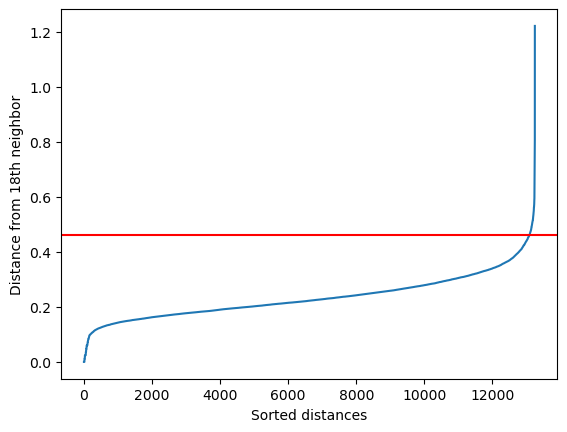

In [33]:
neighbors = NearestNeighbors(n_neighbors=min_pts)
neighbors_fit = neighbors.fit(df_transformed)
distances, indices = neighbors_fit.kneighbors(df_transformed)

distances = np.sort(distances, axis=0)
distances = distances[:,1]
kneedle = KneeLocator(range(distances.shape[0]), distances, S=1.0, curve="convex", direction="increasing")
plt.plot(range(distances.shape[0]), distances)
eps = kneedle.knee_y
plt.axhline(y=eps, color='r', linestyle='-', label="eps")
plt.xlabel('Sorted distances')
plt.ylabel('Distance from 18th neighbor')
plt.show()

In [36]:
dbscan = DBSCAN(eps=eps, min_samples=26)
dbscan.fit(df_transformed)

DBSCAN(eps=0.4612116840228954, min_samples=26)

In [37]:
labels, counts = np.unique(dbscan.labels_, return_counts=True)
print(labels, counts)

[-1  0] [  574 12673]


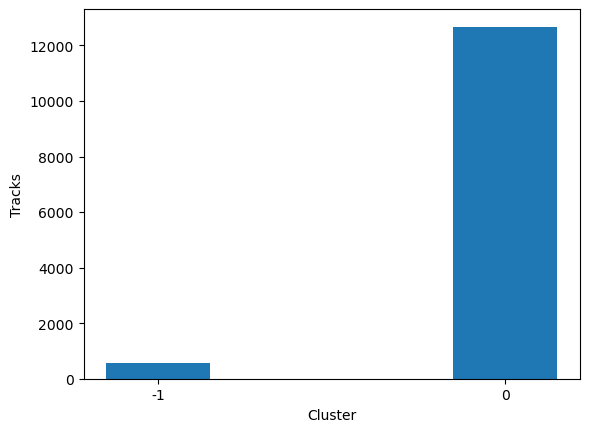

In [38]:
plt.bar(range(len(labels)), counts, width=0.3)
plt.xticks(range(len(labels)), labels)
plt.xlabel('Cluster')
plt.ylabel('Tracks')
plt.show()

In [39]:
from sklearn.metrics import silhouette_samples, silhouette_score

In [40]:
hist, bins = np.histogram(dbscan.labels_, bins=range(-1, len(set(dbscan.labels_)) + 1))
silhouette = silhouette_score(df_transformed, dbscan.labels_)
print(f'Number of clusters {len(set(dbscan.labels_))} ')
print('Labels %s' % dict(zip(bins, hist)))
print('Silhouette score %s' % silhouette)

Number of clusters 2 
Labels {-1: 574, 0: 12673, 1: 0}
Silhouette score 0.18603020468291698


In [41]:
b['cluster'] = dbscan.labels_
b

,duration_ms,popularity,danceability,energy,loudness,speechiness,acousticness,instrumentalness,liveness,valence,tempo,n_beats,n_bars,cluster
0,0.377693,0.554217,0.687095,0.512990,0.529137,0.232565,0.303213,0.536000,0.345040,0.638191,0.600430,0.464912,0.463415,0
1,0.724078,0.000000,0.017048,0.195984,0.062343,0.179639,0.284137,0.934000,0.446296,0.033769,0.220424,0.508772,0.512195,-1
2,0.534830,0.036145,0.334268,0.853997,0.722518,0.052615,0.000090,0.800000,0.320687,0.491457,0.454456,0.539474,0.536585,0
3,0.425718,0.277108,0.506905,0.584992,0.792431,0.167186,0.066667,0.001270,0.134837,0.386935,0.592781,0.510526,0.512195,0
4,0.490547,0.301205,0.636383,0.686994,0.574363,0.096824,0.000578,0.096900,0.368111,0.640201,0.610326,0.610526,0.609756,0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
13242,0.703569,0.000000,0.540354,0.656993,0.464359,0.102740,0.016064,0.615000,0.154063,0.033668,0.458397,0.701754,0.710801,0
13243,0.276618,0.530120,0.053733,0.859997,0.259148,0.114259,0.550201,0.940000,0.142528,0.001608,0.315829,0.210526,0.292683,-1
13244,0.648873,0.518072,0.804704,0.534991,0.659452,0.113948,0.001837,0.857000,0.076262,0.071156,0.507911,0.701754,0.700348,0
13245,0.301459,0.445783,0.493958,0.969999,0.918258,0.094334,0.000338,0.000014,0.500128,0.271357,0.702086,0.417544,0.425087,0


Text(0.5, 1.0, 'Centroids analysis')

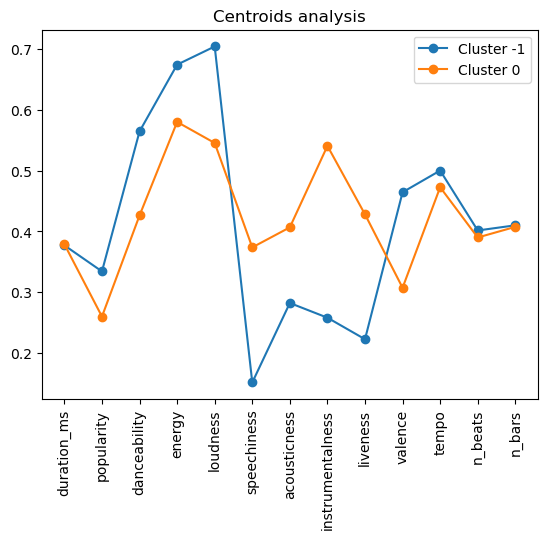

In [42]:
plot_basic_statistics(b, dbscan.labels_, b.columns)
plt.xticks(rotation=90)
plt.title('Centroids analysis')

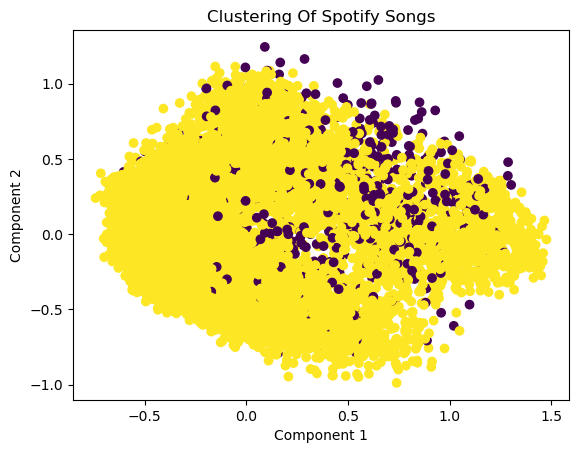

In [43]:
import matplotlib.pyplot as plt
from sklearn.decomposition import PCA
import numpy as np

# To visualize the generated clusters, we will first need to reduce the data to two dimensions, so that we can plot it on a scatter plot

pca = PCA(n_components=2)  # initialize a PCA model with 2 components
df_2d = pca.fit_transform(b)  # reduce the data to two dimensions using the PCA model

# plot the data points on a scatter plot
plt.scatter(df_2d[:, 0], df_2d[:, 1], c=dbscan.labels_)
plt.title('Clustering Of Spotify Songs')
plt.xlabel('Component 1')
plt.ylabel('Component 2')
plt.show()

## Hiearachical 

In [44]:
from scipy.stats import mode
from scipy.spatial.distance import pdist
from scipy.cluster.hierarchy import linkage, dendrogram
from sklearn.cluster import AgglomerativeClustering

In [45]:
df_hi= pd.read_csv('df_final1.csv')
c = df_hi[selected_attributes]

In [46]:
from sklearn.preprocessing import MinMaxScaler
scaler = MinMaxScaler()
df_trans = scaler.fit_transform(c)

In [47]:
d = pd.DataFrame(df_trans, columns= c.columns)
d.head()

,duration_ms,popularity,danceability,energy,loudness,speechiness,acousticness,instrumentalness,liveness,valence,tempo,n_beats,n_bars
0,0.377693,0.554217,0.687095,0.512990,0.529137,0.232565,0.303213,0.53600,0.345040,0.638191,0.600430,0.464912,0.463415
1,0.724078,0.000000,0.017048,0.195984,0.062343,0.179639,0.284137,0.93400,0.446296,0.033769,0.220424,0.508772,0.512195
2,0.534830,0.036145,0.334268,0.853997,0.722518,0.052615,0.000090,0.80000,0.320687,0.491457,0.454456,0.539474,0.536585
3,0.425718,0.277108,0.506905,0.584992,0.792431,0.167186,0.066667,0.00127,0.134837,0.386935,0.592781,0.510526,0.512195
4,0.490547,0.301205,0.636383,0.686994,0.574363,0.096824,0.000578,0.09690,0.368111,0.640201,0.610326,0.610526,0.609756


In [48]:
from scipy.spatial.distance import pdist
from scipy.cluster.hierarchy import linkage, dendrogram, fcluster

# auxiliary function to generate dendrogram with
# given method and metric
def hierarchical(method, metric):
    data_dist = pdist(df_trans, metric=metric)
    data_link = linkage(data_dist, method=method, metric=metric)
    dendrogram(data_link, truncate_mode='lastp')

    max_d = 0.7*max(data_link[:,2])
    app = fcluster(data_link, max_d, criterion='distance')
    silhouette_avg = silhouette_score(df_trans, app)
    print("Silhouette Score:", silhouette_avg)
    print(np.unique(app, return_counts=True))

Silhouette Score: 0.27497019288387614
(array([1, 2, 3, 4], dtype=int32), array([13244,     1,     1,     1], dtype=int64))


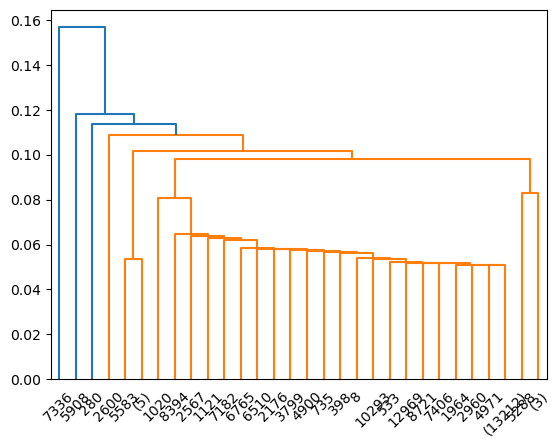

In [49]:
hierarchical(method='single', metric='cosine')

Silhouette Score: 0.04988903984727565
(array([ 1,  2,  3,  4,  5,  6,  7,  8,  9, 10, 11, 12, 13, 14, 15, 16, 17],
      dtype=int32), array([ 365, 1053,  249,  202,    1, 2093,  133, 1057, 3295,  581,  314,
        197,  175, 1124,  573,  463, 1372], dtype=int64))


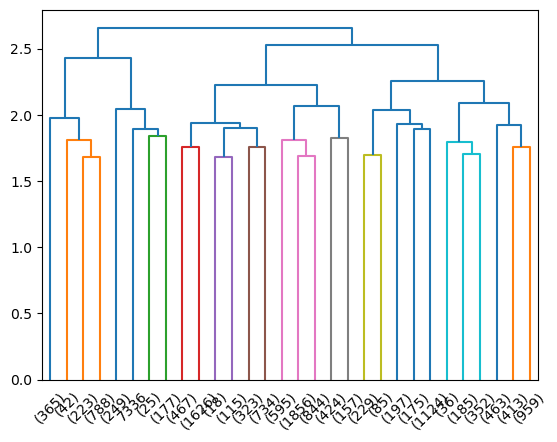

In [50]:
hierarchical(method='complete', metric='euclidean')

Silhouette Score: 0.04821360582386277
(array([ 1,  2,  3,  4,  5,  6,  7,  8,  9, 10, 11], dtype=int32), array([1424,    7,  476,  910, 1297, 2038, 3555,  536, 1170,  213, 1621],
      dtype=int64))


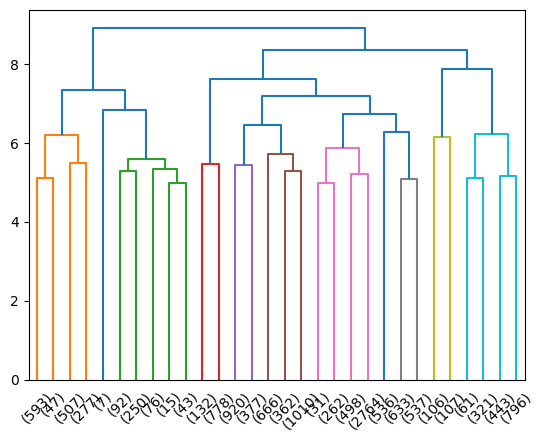

In [51]:
hierarchical(method='complete', metric='cityblock')

Silhouette Score: 0.21864678193212264
(array([1, 2, 3, 4, 5, 6], dtype=int32), array([    1,     1, 11829,  1347,    68,     1], dtype=int64))


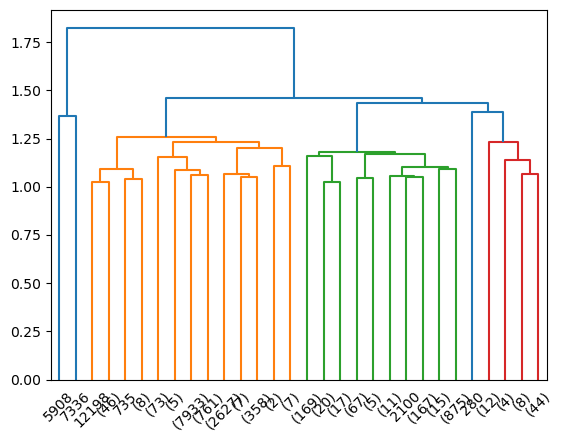

In [52]:
hierarchical(method='average', metric='euclidean')

Silhouette Score: 0.42614590844368944
(array([1, 2], dtype=int32), array([13246,     1], dtype=int64))


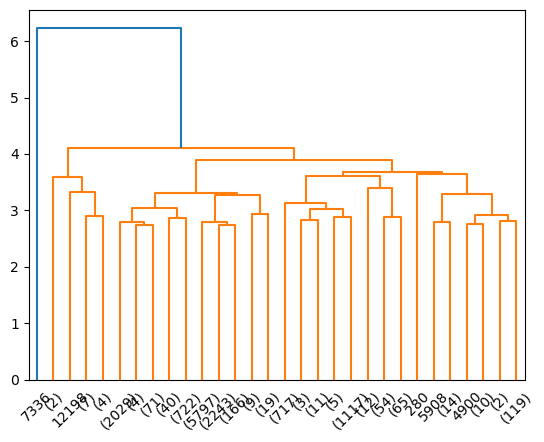

In [53]:
hierarchical(method='average', metric='cityblock')

Silhouette Score: 0.18791648353923407
(array([1, 2, 3], dtype=int32), array([3823, 2309, 7115], dtype=int64))


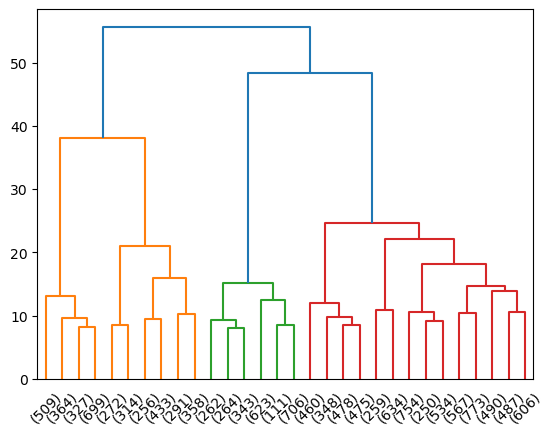

In [54]:
hierarchical(method='ward', metric='euclidean')

In [55]:
def hierarchical(method, metric, df_trans):
    data_dist = pdist(df_trans, metric=metric)
    data_link = linkage(data_dist, method=method, metric=metric)
    dendrogram(data_link, truncate_mode='lastp')

    max_d = 0.7 * max(data_link[:, 2])
    app = fcluster(data_link, max_d, criterion='distance')
    
    # Add the cluster labels to the original dataframe
    c['Cluster_Labels'] = app
    
    silhouette_avg = silhouette_score(df_trans, app)
    print("Silhouette Score:", silhouette_avg)
    print(np.unique(app, return_counts=True))

C:\Users\minhd\AppData\Local\Temp\ipykernel_14700\3848953872.py:10: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  c['Cluster_Labels'] = app


Silhouette Score: 0.18791648353923407
(array([1, 2, 3], dtype=int32), array([3823, 2309, 7115], dtype=int64))


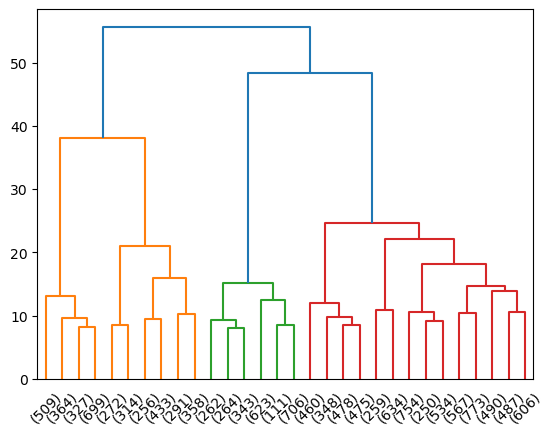

In [56]:
# Assuming 'selected_attributes' contains the features you want to use
hierarchical(method='ward', metric='euclidean', df_trans=df_trans)

In [57]:
 c['Cluster_Labels'] 

0        1
1        1
2        2
3        3
4        3
        ..
13242    2
13243    1
13244    2
13245    3
13246    3
Name: Cluster_Labels, Length: 13247, dtype: int32

In [58]:
df_trans

array([[0.37769328, 0.55421687, 0.68709538, ..., 0.60043006, 0.46491228,
        0.46341463],
       [0.72407769, 0.        , 0.01704791, ..., 0.22042367, 0.50877193,
        0.51219512],
       [0.53483027, 0.03614458, 0.33426845, ..., 0.45445627, 0.53947368,
        0.53658537],
       ...,
       [0.64887302, 0.51807229, 0.80470436, ..., 0.50791098, 0.70175439,
        0.70034843],
       [0.30145925, 0.44578313, 0.4939577 , ..., 0.7020864 , 0.41754386,
        0.42508711],
       [0.30344432, 0.43373494, 0.6741476 , ..., 0.29118899, 0.21842105,
        0.22299652]])

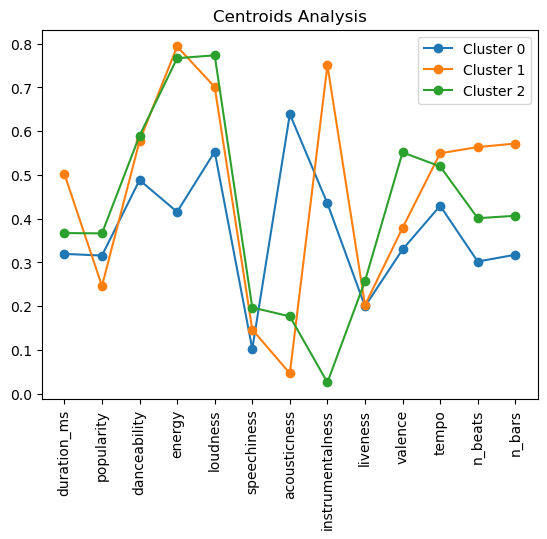

In [59]:
def plot_basic_statistics1(df, labels, columns):
    df = pd.DataFrame(df, columns=columns)
    df['cluster'] = labels
    means = [df.loc[df['cluster'] == i, columns].mean().values for i in np.unique(df['cluster'])]
    legend = []
    for i, mean_vals in enumerate(means):
        plt.plot(range(0, len(columns)), mean_vals, marker='o')
        legend.append('Cluster %d' % i)
    plt.legend(legend)
    plt.xticks(range(0, len(columns)), columns, rotation=90)  # Rotate x-axis labels for better readability
    plt.title('Centroids Analysis')
    df = df.drop('cluster', axis=1)
plot_basic_statistics1(d, c['Cluster_Labels'], d.columns)
plt.show()

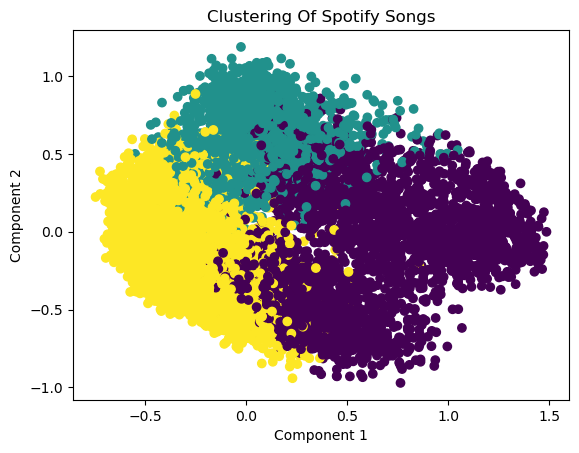

In [60]:
import matplotlib.pyplot as plt
from sklearn.decomposition import PCA
import numpy as np

# to visualize the generated clusters, we will first need to reduce the data to two dimensions, so that we can plot it on a scatter plot

pca = PCA(n_components=2)  # initialize a PCA model with 2 components
df_2d = pca.fit_transform(df_trans)  # reduce the data to two dimensions using the PCA model

# plot the data points on a scatter plot
plt.scatter(df_2d[:, 0], df_2d[:, 1], c=c['Cluster_Labels'])
plt.title('Clustering Of Spotify Songs')
plt.xlabel('Component 1')
plt.ylabel('Component 2')
plt.show()

In [61]:
d.columns

Index(['duration_ms', 'popularity', 'danceability', 'energy', 'loudness',
       'speechiness', 'acousticness', 'instrumentalness', 'liveness',
       'valence', 'tempo', 'n_beats', 'n_bars', 'cluster'],
      dtype='object')

In [62]:
e = c['Cluster_Labels']
e

0        1
1        1
2        2
3        3
4        3
        ..
13242    2
13243    1
13244    2
13245    3
13246    3
Name: Cluster_Labels, Length: 13247, dtype: int32